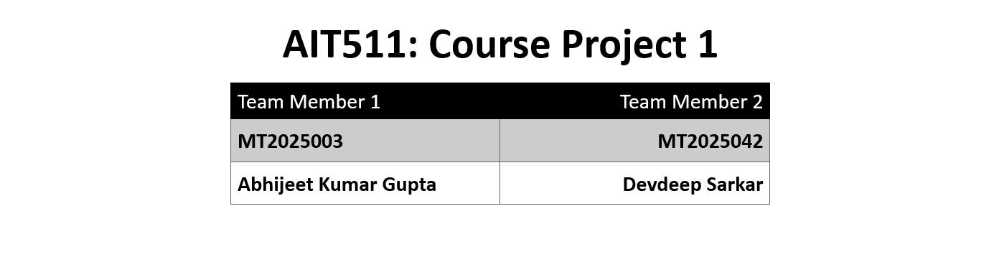

# **Headers Files and Installation**

In [ ]:
!pip install ydata-profiling

In [ ]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.9/400.9 kB 13.6 MB/s eta 0:00:00


In [ ]:
!pip install -U xgboost


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.9/115.9 MB 7.6 MB/s eta 0:00:00
  Attempting uninstall: xgboost
    Found existing installation: xgboost 2.0.3
    Uninstalling xgboost-2.0.3:
      Successfully uninstalled xgboost-2.0.3


In [ ]:
import pandas as pd
from ydata_profiling import ProfileReport
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder
pd.pandas.set_option('display.max_columns',None)
from statsmodels.stats.outliers_influence import variance_inflation_factor
from scipy.stats import chi2_contingency
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew, boxcox
from sklearn.preprocessing import PowerTransformer, QuantileTransformer, RobustScaler

# **EDA**

In [ ]:
train_df = pd.read_csv('train.csv')
test_df = pd.read_csv('test.csv')

In [ ]:
# Generate the profiling report
profile = ProfileReport(train_df, title="Train Dataset Profiling Report", explorative=True)
# To view in notebook
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 18/18 [00:00<00:00, 20.65it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Save the report as an HTML file
profile.to_file("train_dataset_profile.html")  # This creates the file in Colab
# Download the report
files.download("train_dataset_profile.html")  # This will now work

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Load the datasets
train_df = pd.read_csv('train.csv')
test_df = pd.read_csv('test.csv')

In [ ]:
print("Displaying first few rows of training data:")
train_df.head()

Displaying first few rows of training data:


,id,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,WeightCategory
0,0,Male,24.443011,1.699998,81.669950,yes,yes,2.000000,2.983297,Sometimes,no,2.763573,no,0.000000,0.976473,Sometimes,Public_Transportation,Overweight_Level_II
1,1,Female,18.000000,1.560000,57.000000,yes,yes,2.000000,3.000000,Frequently,no,2.000000,no,1.000000,1.000000,no,Automobile,Normal_Weight
2,2,Female,18.000000,1.711460,50.165754,yes,yes,1.880534,1.411685,Sometimes,no,1.910378,no,0.866045,1.673584,no,Public_Transportation,Insufficient_Weight
3,3,Female,20.952737,1.710730,131.274851,yes,yes,3.000000,3.000000,Sometimes,no,1.674061,no,1.467863,0.780199,Sometimes,Public_Transportation,Obesity_Type_III
4,4,Male,31.641081,1.914186,93.798055,yes,yes,2.679664,1.971472,Sometimes,no,1.979848,no,1.967973,0.931721,Sometimes,Public_Transportation,Overweight_Level_II


In [ ]:
print("\nTraining Data Info:")
train_df.info()


Training Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15533 entries, 0 to 15532
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              15533 non-null  int64  
 1   Gender                          15533 non-null  object 
 2   Age                             15533 non-null  float64
 3   Height                          15533 non-null  float64
 4   Weight                          15533 non-null  float64
 5   family_history_with_overweight  15533 non-null  object 
 6   FAVC                            15533 non-null  object 
 7   FCVC                            15533 non-null  float64
 8   NCP                             15533 non-null  float64
 9   CAEC                            15533 non-null  object 
 10  SMOKE                           15533 non-null  object 
 11  CH2O                            15533 non-null  float64
 12  SCC        



*   Training data has 18 columns and 15,533 rows.

* Mix of numeric (Age, Height, Weight) and categorical (Gender, FAVC, CALC) features.

* Target variable: WeightCategory.



In [ ]:
# Check for missing values in the training dataset
missing_values = train_df.isnull().sum()
print("Missing values in each column:")
print(missing_values)
if missing_values.sum() == 0:
    print("\nThere are no missing values in the dataset.")
else:
    print("\nMissing values detected.")

Missing values in each column:
id                                0
Gender                            0
Age                               0
Height                            0
Weight                            0
family_history_with_overweight    0
FAVC                              0
FCVC                              0
NCP                               0
CAEC                              0
SMOKE                             0
CH2O                              0
SCC                               0
FAF                               0
TUE                               0
CALC                              0
MTRANS                            0
WeightCategory                    0
dtype: int64

There are no missing values in the dataset.



* No missing values found across all columns.



In [ ]:
# Separate features (X)/ Independent features and the target variable/ Dependent Feature (y)
# We'll also drop the 'id' column as it's not a feature
X = train_df.drop(['WeightCategory', 'id'], axis=1)
y = train_df['WeightCategory']

Original class distribution:
WeightCategory
Obesity_Type_III       2983
Obesity_Type_II        2403
Normal_Weight          2345
Obesity_Type_I         2207
Overweight_Level_II    1881
Insufficient_Weight    1870
Overweight_Level_I     1844
Name: count, dtype: int64


/tmp/ipython-input-2740074161.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y='WeightCategory', data=train_df,


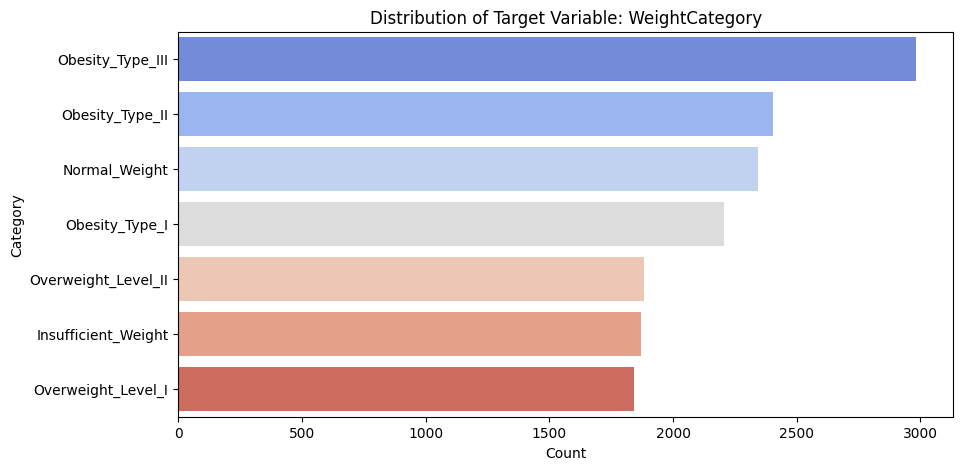

In [ ]:
# Target variable distribution/ class distribution
print("Original class distribution:")
print(y.value_counts())
plt.figure(figsize=(10, 5))
sns.countplot(y='WeightCategory', data=train_df,
              order=train_df['WeightCategory'].value_counts().index,
              palette="coolwarm")
plt.title("Distribution of Target Variable: WeightCategory")
plt.xlabel("Count")
plt.ylabel("Category")
plt.show()

* Clear class imbalance in WeightCategory.

* Highest samples in Obesity Type III, lowest in Overweight Level I.

Numeric Features distribution:


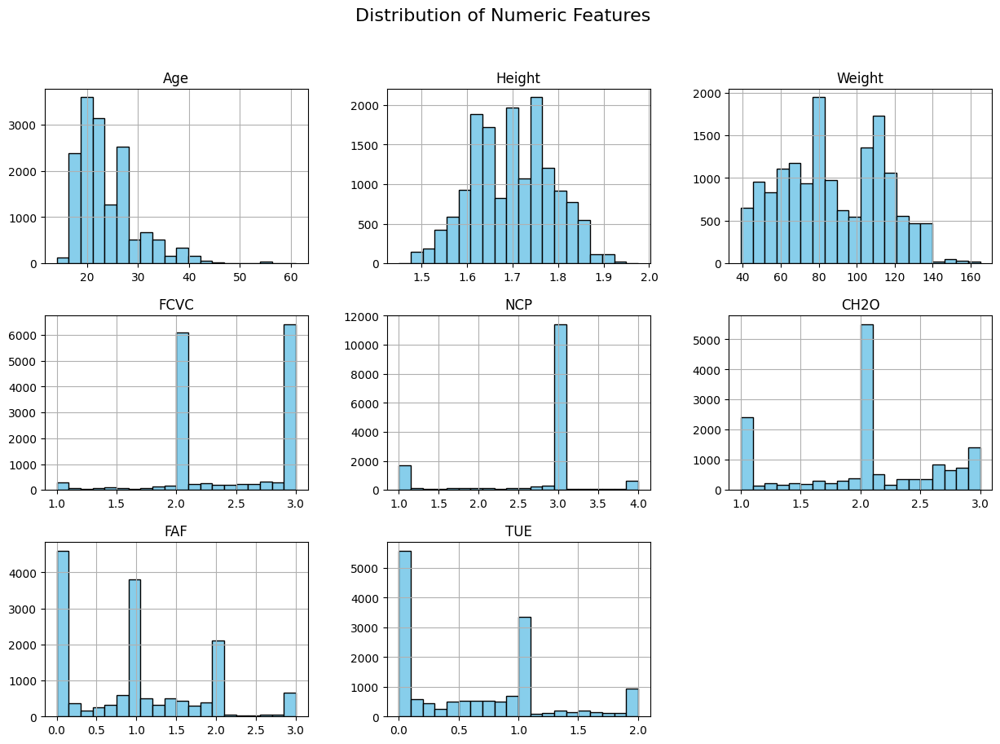

In [ ]:
# Distribution of numeric features
print("Numeric Features distribution:")
numeric_cols = train_df.select_dtypes(include=['float64', 'int64']).columns.drop('id')
train_df[numeric_cols].hist(figsize=(15, 10), bins=20, color='skyblue', edgecolor='black')
plt.suptitle("Distribution of Numeric Features", fontsize=16)
plt.show()


* Age slightly right-skewed; most participants are young adults.

* Height roughly symmetric; Weight moderately right-skewed.

* No severe outliers at this stage; data reflects realistic ranges.

Categorical Features distribution:


/tmp/ipython-input-1736101235.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=train_df, palette='Set2')


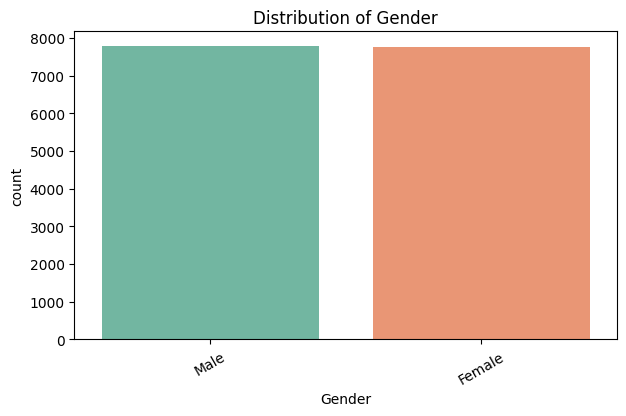

/tmp/ipython-input-1736101235.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=train_df, palette='Set2')


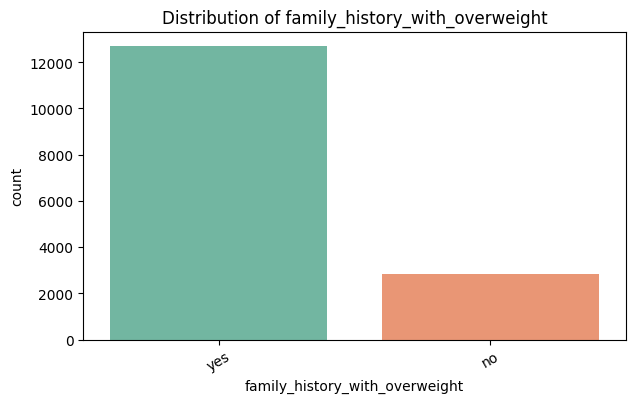

/tmp/ipython-input-1736101235.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=train_df, palette='Set2')


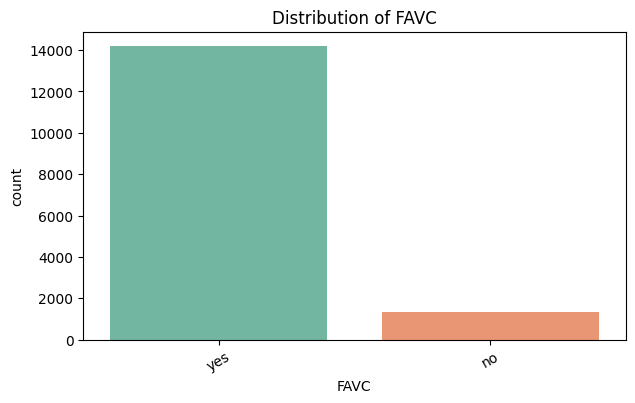

/tmp/ipython-input-1736101235.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=train_df, palette='Set2')


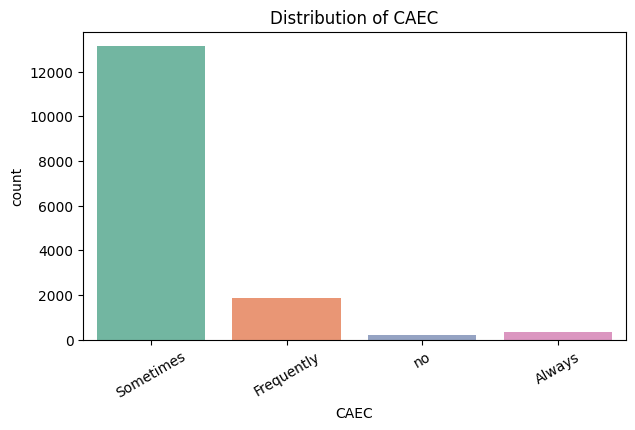

/tmp/ipython-input-1736101235.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=train_df, palette='Set2')


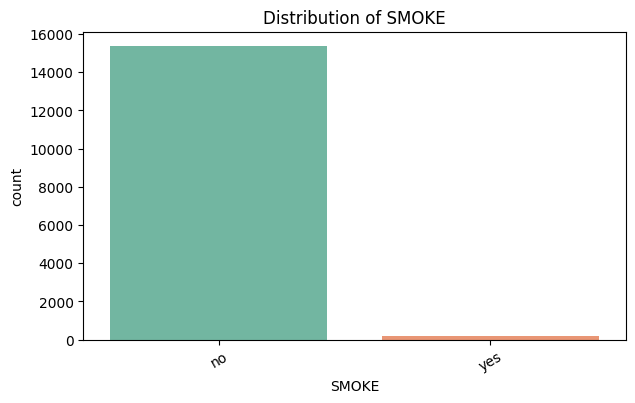

/tmp/ipython-input-1736101235.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=train_df, palette='Set2')


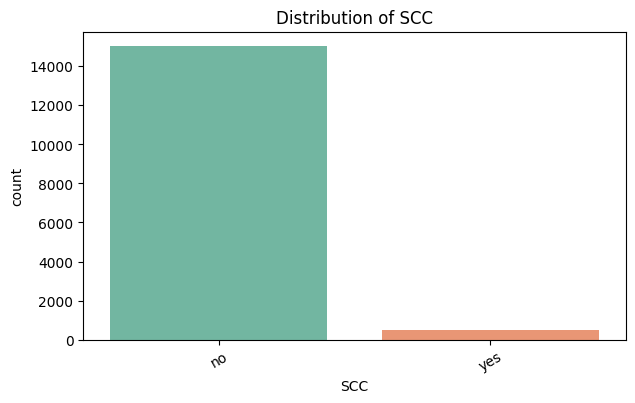

/tmp/ipython-input-1736101235.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=train_df, palette='Set2')


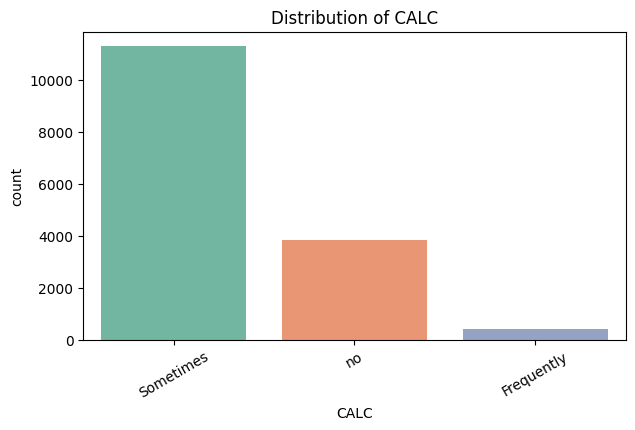

/tmp/ipython-input-1736101235.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=train_df, palette='Set2')


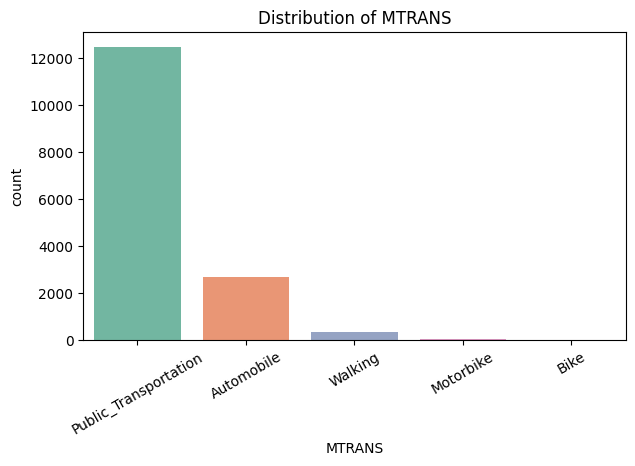

In [ ]:
# Distribution of categorical features
print("Categorical Features distribution:")
categorical_cols = train_df.select_dtypes(include=['object']).columns.drop('WeightCategory')

for col in categorical_cols:
    plt.figure(figsize=(7, 4))
    sns.countplot(x=col, data=train_df, palette='Set2')
    plt.title(f"Distribution of {col}")
    plt.xticks(rotation=30)
    plt.show()

* Gender: Well balanced between males and females — ensures unbiased model learning across genders.

* family_history_with_overweight: Slightly more “yes” responses — genetic influence on obesity likely boosts model accuracy.

* FAVC: Majority “yes” (frequent high-calorie eaters) — strong positive signal for predicting higher obesity risk.

* CAEC: “Sometimes” dominates — useful mid-level lifestyle variable that helps model differentiate moderate obesity.

* SMOKE: Mostly “no” — low variance, minimal effect on model accuracy, can be retained for completeness.

* SCC: Majority “no” (don’t monitor calories) — contributes weakly but supports lifestyle pattern understanding.

* CALC: “Sometimes” most frequent — mild imbalance, adds secondary influence on obesity prediction.

* MTRANS: Mostly “Public Transportation” — strong imbalance, but helps identify sedentary vs. active behavior trends.

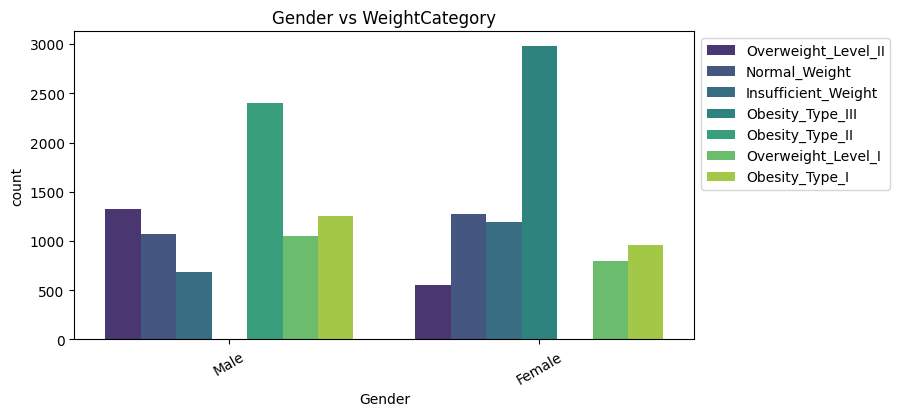

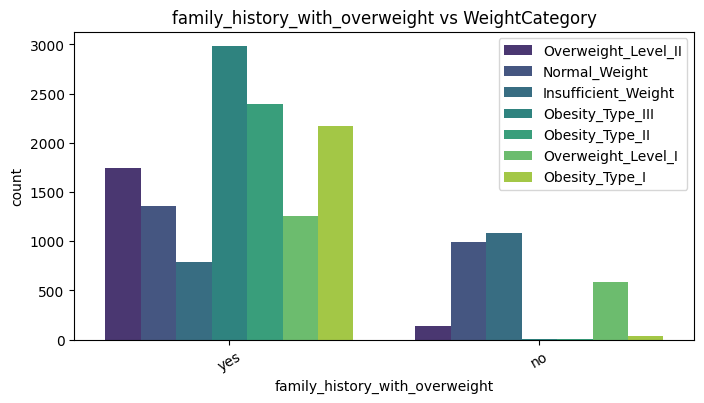

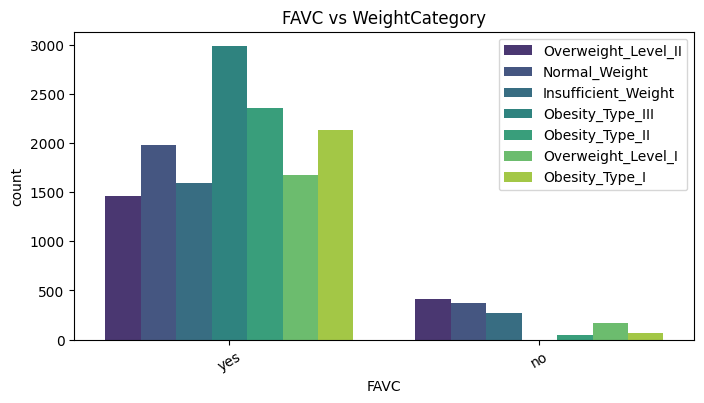

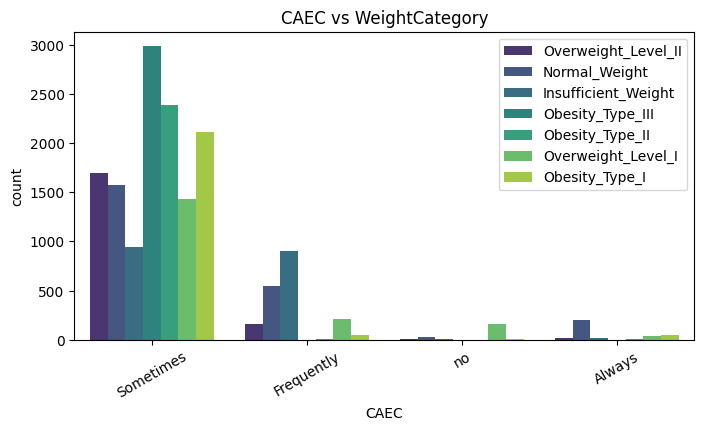

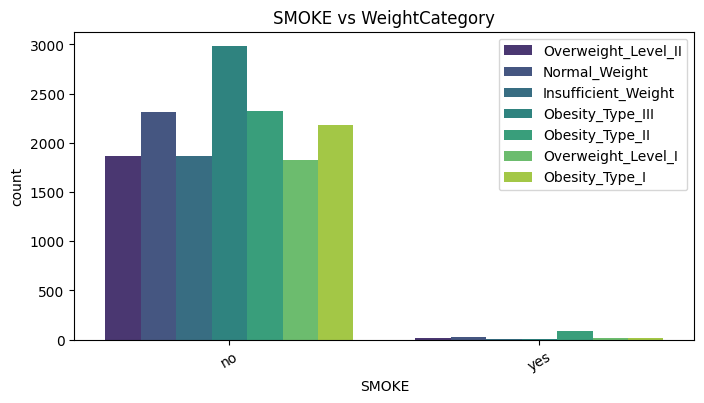

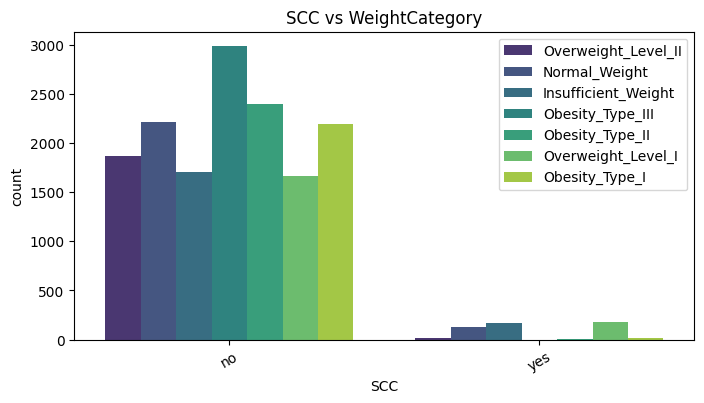

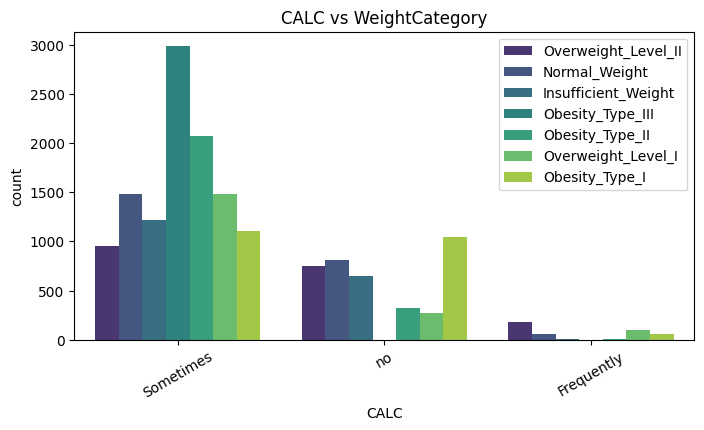

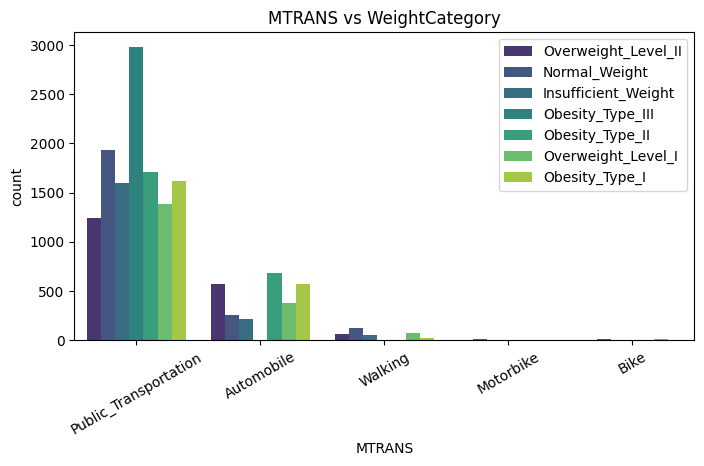

In [ ]:
# Relationship b/w categorical features vs target
for col in categorical_cols:
    print()
    plt.figure(figsize=(8, 4))
    sns.countplot(x=col, hue='WeightCategory', data=train_df, palette='viridis')
    plt.title(f"{col} vs WeightCategory")
    plt.xticks(rotation=30)
    plt.legend(bbox_to_anchor=(1, 1))
    plt.show()

* Family History with Overweight:
Strong hereditary factor — individuals with family obesity history are likelier to be obese; major accuracy booster.

* FAVC (High-Calorie Food Consumption):
Frequent high-calorie intake strongly linked to higher obesity; one of the most predictive features.

* CAEC (Eating Between Meals):
Snacking frequency correlates with overweight/obesity; helps distinguish mild vs. severe obesity.

* FCVC (Vegetable Consumption):
High vegetable intake linked to normal weight; improves model’s precision for healthy-weight classes.

* FAF (Physical Activity Frequency):
Low activity strongly associated with obesity; top behavioral feature enhancing model robustness.

* CALC (Alcohol Consumption):
Occasional drinking common; minor but relevant predictor when paired with diet features.

* MTRANS (Transportation Mode):
Sedentary transport choices (e.g., public transport, car) align with higher obesity; moderate influence on accuracy.

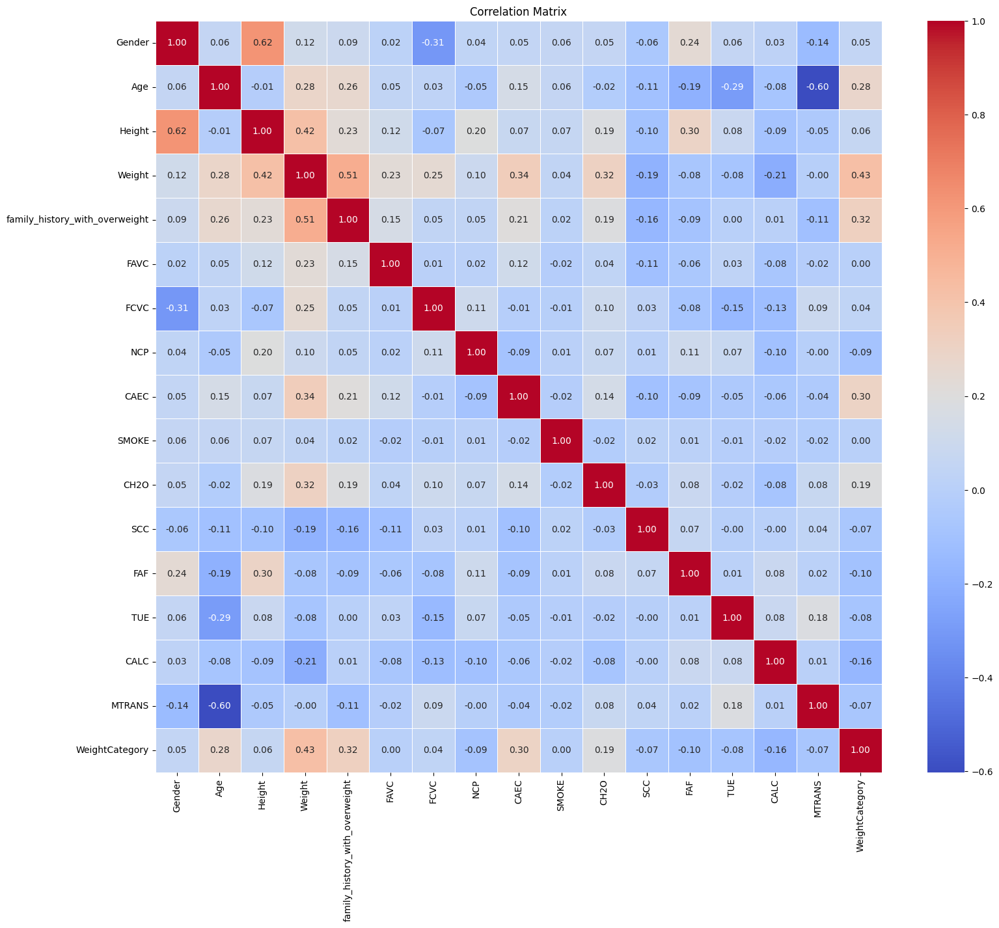

In [ ]:
# Plotting corelation matrix
df_cor = train_df.copy()
le = LabelEncoder()
for col in df_cor.select_dtypes(include='object').columns:
    df_cor[col] = le.fit_transform(df_cor[col])
df_cor = df_cor.drop('id', axis=1)
# Calculate the correlation matrix
corr_matrix = df_cor.corr()
# Plot the heatmap
plt.figure(figsize=(18, 15))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix')
plt.savefig('correlation_matrix_labeled.png')


* The correlation matrix reveals that Height and Weight are highly correlated.

* Age moderately correlated with Weight; lifestyle features show weaker numeric correlation.

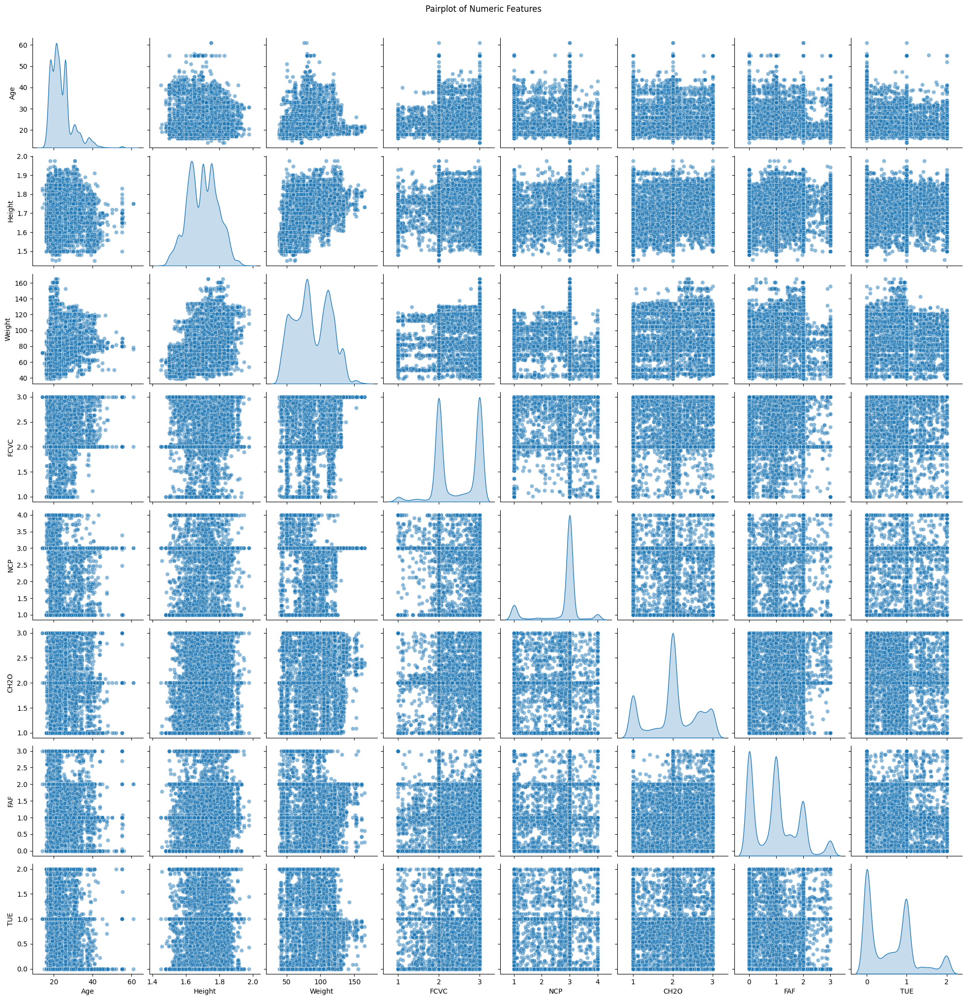

In [ ]:
# Plotting Pairplot for key numerical features
sns.pairplot(train_df[['Age', 'Height', 'Weight', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE']], diag_kind='kde', plot_kws={'alpha':0.5})
plt.suptitle("Pairplot of Numeric Features", y=1.02)
plt.show()

* Weight and Height dominate variation among categories.

* Clusters overlap but indicate that BMI-type combination helps separate obesity classes.

* There is a slight possibility of Multicollinearity between Weight and Height.

**Checking and confirming multicollinearity.**

In [ ]:
# Using VARIANCE INFLATION FACTOR (VIF) ANALYSIS
df = train_df.copy()
# Select numeric features only
numeric_features = ["Age", "Height", "Weight", "FCVC", "NCP", "CH2O", "FAF", "TUE"]
# Drop rows with missing values in selected columns
df_vif = df[numeric_features].dropna()
# Standardize numeric features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(df_vif)
# Compute VIF for each numeric feature
vif_data = pd.DataFrame()
vif_data["Feature"] = numeric_features
vif_data["VIF"] = [
    variance_inflation_factor(scaled_features, i)
    for i in range(len(numeric_features))
]
# Sort VIF values (high → low)
vif_data = vif_data.sort_values(by="VIF", ascending=False).reset_index(drop=True)
print("\nVariance Inflation Factor (VIF) Results:\n")
print(vif_data)


Variance Inflation Factor (VIF) Results:

  Feature       VIF
0  Weight  1.668757
1  Height  1.514290
2     Age  1.255469
3     FAF  1.202007
4    FCVC  1.156427
5    CH2O  1.139718
6     TUE  1.139282
7     NCP  1.067661


* All VIF values < 2 → no multicollinearity issue among numeric features.

* Weight and Height slightly correlated but not critical.

In [ ]:
# Multicollinearity if BMI is added

# BMI Transformation + VIF Calculation
df = train_df.copy()
# Compute BMI = Weight / (Height^2)
df["BMI"] = df["Weight"] / (df["Height"] ** 2)
# Select numeric features (replacing Height & Weight with BMI)
numeric_features_bmi = ["Age", "BMI", "FCVC", "NCP", "CH2O", "FAF", "TUE"]
# Drop rows with missing values
df_vif_bmi = df[numeric_features_bmi].dropna()
# Standardize for stability
scaler = StandardScaler()
scaled_features_bmi = scaler.fit_transform(df_vif_bmi)
# Compute VIF
vif_data_bmi = pd.DataFrame()
vif_data_bmi["Feature"] = numeric_features_bmi
vif_data_bmi["VIF"] = [
    variance_inflation_factor(scaled_features_bmi, i)
    for i in range(len(numeric_features_bmi))
]
# Sort and display results
vif_data_bmi = vif_data_bmi.sort_values(by="VIF", ascending=False).reset_index(drop=True)
print("\nVariance Inflation Factor (VIF) Results with BMI:\n")
print(vif_data_bmi)


Variance Inflation Factor (VIF) Results with BMI:

  Feature       VIF
0     BMI  1.389171
1     Age  1.261921
2    FCVC  1.144032
3    CH2O  1.132676
4     TUE  1.132242
5     FAF  1.101330
6     NCP  1.038292


* BMI has reduced multicollinearity.

**Calculating strength of association between categorical variables and WeightCategory(Target Variable).**

In [ ]:
# categorical feature importance analysis using Cramers V
def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))

categorical_cols = ['Gender','family_history_with_overweight','FAVC', 'CAEC','SMOKE','SCC','CALC','MTRANS']
cramers_results = {}

for col in categorical_cols:
    cramers_results[col] = cramers_v(train_df[col], train_df['WeightCategory'])

pd.DataFrame(cramers_results.items(), columns=['Feature', 'Cramers_V']).sort_values(by='Cramers_V', ascending=False)


,Feature,Cramers_V
0,Gender,0.615526
1,family_history_with_overweight,0.558729
3,CAEC,0.330840
6,CALC,0.309133
2,FAVC,0.274230
5,SCC,0.217259
7,MTRANS,0.163242
4,SMOKE,0.100433


* Gender (0.61) and family history with overweight (0.55) strongly associated with target.

* CAEC (eating habits) and CALC (alcohol consumption) moderate correlation.

* SCC, MTRANS, and SMOKE show minimal predictive strength.

**Analysing Outliers**

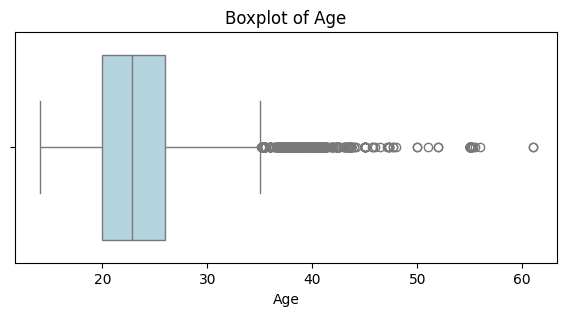

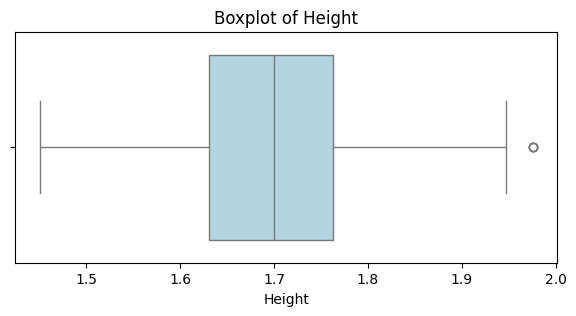

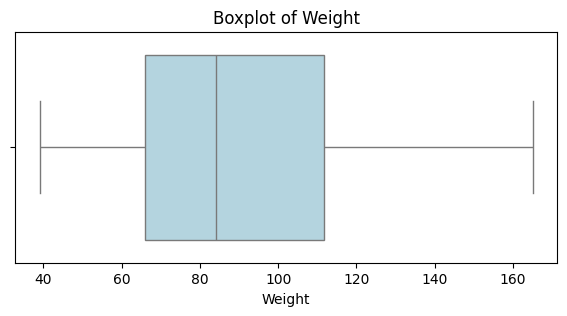

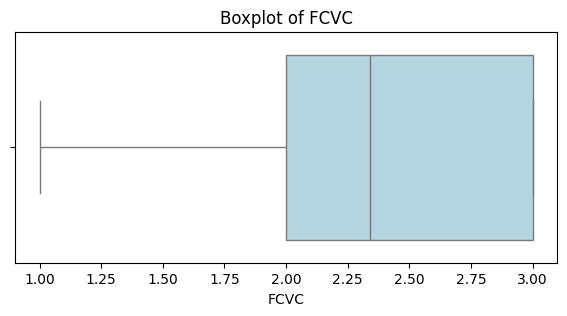

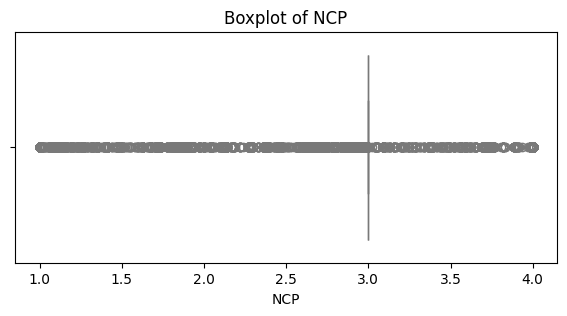

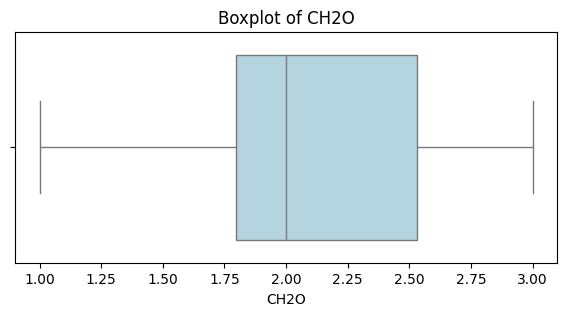

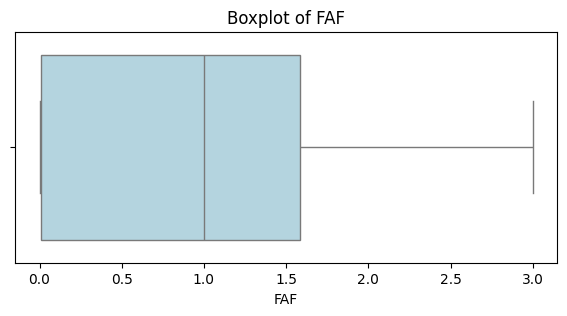

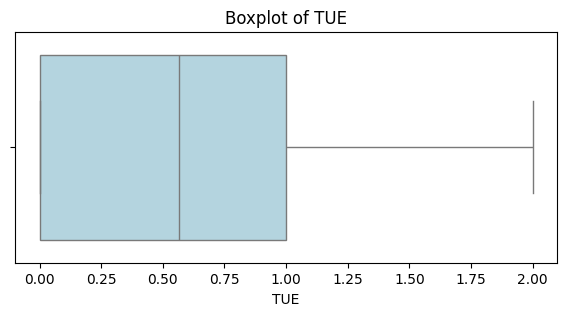

In [ ]:
# Boxplots to detect outliers
for col in numeric_cols:
    print()
    plt.figure(figsize=(7, 3))
    sns.boxplot(x=train_df[col], color='lightblue')
    plt.title(f"Boxplot of {col}")
    plt.show()

* *Age:* The median age is around 22–23 years. Data points beyond 35 years appear as outliers. These “outliers” are not errors — they represent valid older adults (35–60 years). Age is an important risk factor, obesity rates rise with age. People over 35 are exactly the population segment that tends to exhibit higher BMI and weight-related conditions. So, it's better to not remove them.

* *NCP:* The median is exactly 3 meals/day, and almost everyone reports the same.
The outliers on both sides of 1 to 4 are not real anomalies, they just represent people who eat fewer or more than 3 meals per day. So there is no need to remove them.

* No harmful outliers; no removal necessary.

In [ ]:
# Detecting number of outliers
def detect_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers = df[(df[column] < lower) | (df[column] > upper)]
    return outliers.shape[0], lower, upper

for col in ['Age','Height','Weight','FCVC','NCP','CH2O','FAF','TUE']:
    count, lower, upper = detect_outliers_iqr(train_df, col)
    print(f"{col}: {count} outliers (bounds: {lower:.2f}–{upper:.2f})")


Age: 792 outliers (bounds: 11.00–35.00)
Height: 4 outliers (bounds: 1.43–1.96)
Weight: 0 outliers (bounds: -2.40–180.00)
FCVC: 0 outliers (bounds: 0.50–4.50)
NCP: 4548 outliers (bounds: 3.00–3.00)
CH2O: 0 outliers (bounds: 0.69–3.63)
FAF: 0 outliers (bounds: -2.36–3.95)
TUE: 0 outliers (bounds: -1.50–2.50)


* ***Age:*** Those who are older than 35 years are considered as outliers. But the dataset includes people up to 60 years, so they are valid adults, not data errors. It's better to treat them as normal.

* ***NCP:*** The algorithm is flagging anything not equal to 3 as an outlier, this happens when most people report the same meal count (mode = 3). Statistically, the IQR = 0 in that case, which overdetects outliers. Hence, no need to change it.


Numeric columns detected: ['id', 'Age', 'Height', 'Weight', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE']

Column: Weight | Original Skewness = 0.1085


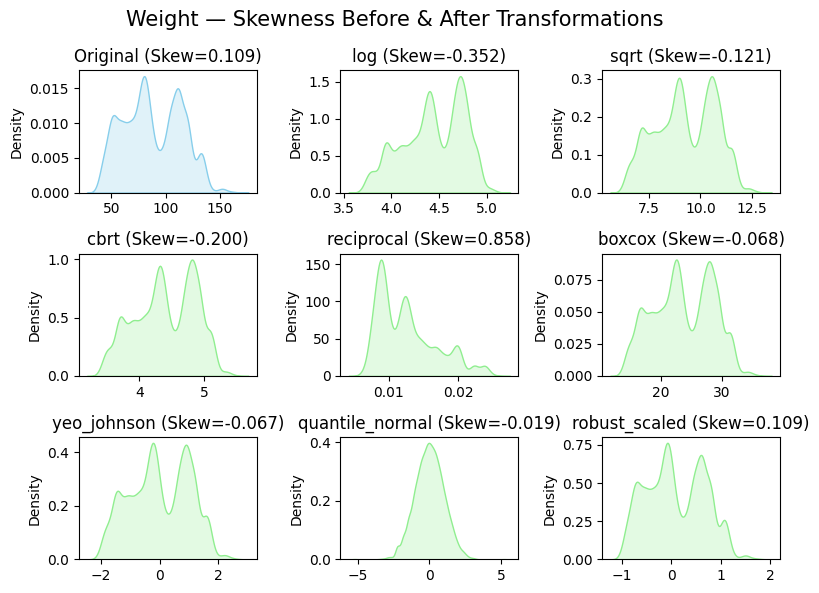

Skewness Comparison:
   original        →  0.1085
   log             → -0.3524
   sqrt            → -0.1215
   cbrt            → -0.1997
   reciprocal      →  0.8577
   boxcox          → -0.0677
   yeo_johnson     → -0.0666
   quantile_normal → -0.0187
   robust_scaled   →  0.1085

Column: Age | Original Skewness = 1.5718


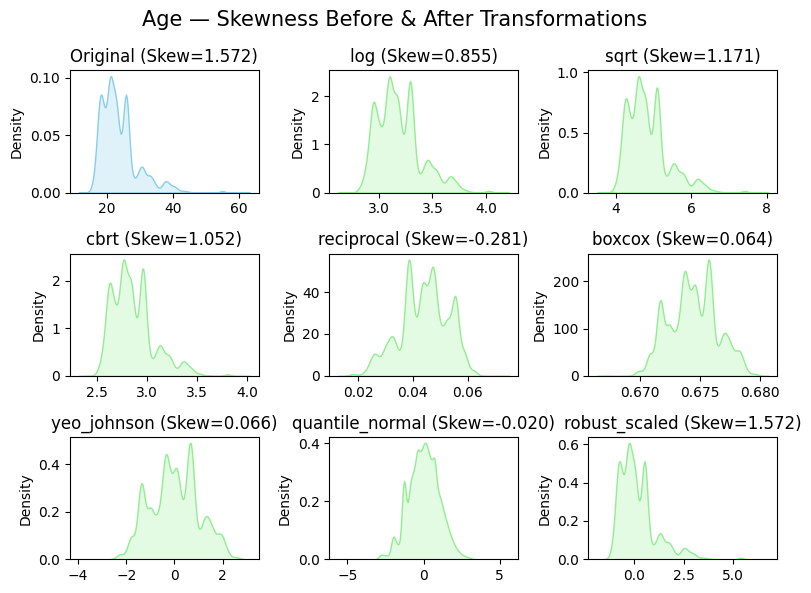

Skewness Comparison:
   original        →  1.5718
   log             →  0.8553
   sqrt            →  1.1708
   cbrt            →  1.0520
   reciprocal      → -0.2812
   boxcox          →  0.0635
   yeo_johnson     →  0.0660
   quantile_normal → -0.0203
   robust_scaled   →  1.5718

Column: NCP | Original Skewness = -1.5611


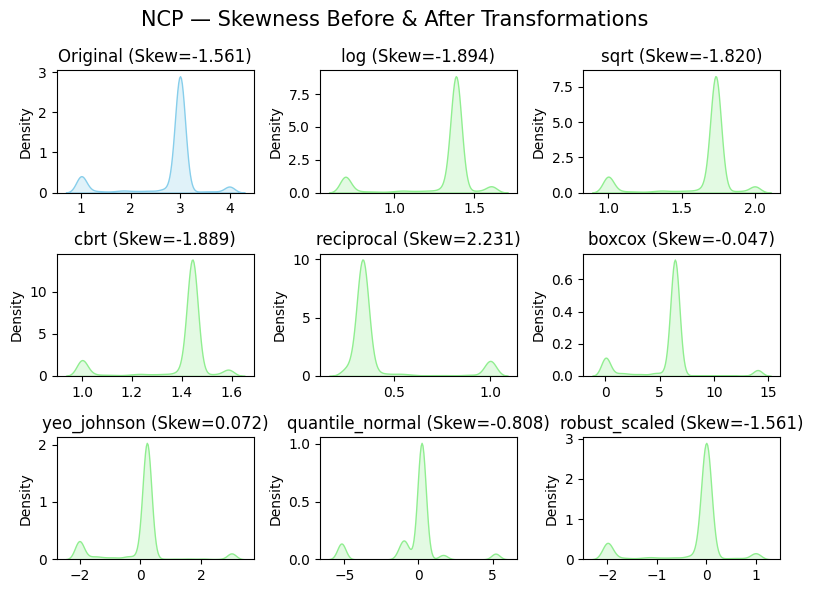

Skewness Comparison:
   original        → -1.5611
   log             → -1.8944
   sqrt            → -1.8201
   cbrt            → -1.8887
   reciprocal      →  2.2308
   boxcox          → -0.0467
   yeo_johnson     →  0.0725
   quantile_normal → -0.8081
   robust_scaled   → -1.5611


In [ ]:
# Mathematical Transformations for Skewness Correction & Visualization
df = pd.read_csv("train.csv")
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
print(f"Numeric columns detected: {numeric_cols}")

def safe_boxcox(x):
    # Apply Box-Cox safely (positive values only).
    x = np.array(x)
    if (x <= 0).any():
        x = x + abs(x.min()) + 1e-6
    return boxcox(x)[0]

def safe_reciprocal(x):
    # Avoid division by zero.
    x = np.array(x)
    x = np.where(x == 0, 1e-6, x)
    return 1 / x

# Applying Transformation Methods
transformations = {
    "log": lambda x: np.log1p(x),
    "sqrt": lambda x: np.sqrt(np.clip(x, 0, None)),
    "cbrt": lambda x: np.cbrt(x),
    "reciprocal": lambda x: safe_reciprocal(x),
    "boxcox": lambda x: safe_boxcox(x),
    "yeo_johnson": lambda x: PowerTransformer(method="yeo-johnson").fit_transform(x.reshape(-1, 1)).flatten(),
    "quantile_normal": lambda x: QuantileTransformer(output_distribution="normal", random_state=10).fit_transform(x.reshape(-1, 1)).flatten(),
    "robust_scaled": lambda x: RobustScaler().fit_transform(x.reshape(-1, 1)).flatten()
}

# Applying Visualization Function
def visualize_transformations(df, column):
    """Plot skewness before and after each mathematical transformation."""
    x = df[column].dropna().values
    original_skew = skew(x)
    print(f"\nColumn: {column} | Original Skewness = {original_skew:.4f}")

    # Skewness tracker
    skew_data = [("original", original_skew)]

    # Create 3x3 plot grid (9 slots total)
    fig, axes = plt.subplots(3, 3, figsize=(8, 6))
    axes = axes.flatten()

    # Plot Original
    sns.kdeplot(x, ax=axes[0], fill=True, color="skyblue")
    axes[0].set_title(f"Original (Skew={original_skew:.3f})")

    # Apply and visualize each transformation
    for i, (name, func) in enumerate(transformations.items(), start=1):
        try:
            transformed = func(x)
            transformed_skew = skew(transformed)
            skew_data.append((name, transformed_skew))

            sns.kdeplot(transformed, ax=axes[i], fill=True, color="lightgreen")
            axes[i].set_title(f"{name} (Skew={transformed_skew:.3f})")
        except Exception as e:
            axes[i].set_title(f"{name} Error")
            continue

    # Hide extra subplot if any remain unused
    for j in range(len(transformations) + 1, len(axes)):
        axes[j].axis("off")

    plt.suptitle(f"{column} — Skewness Before & After Transformations", fontsize=15)
    plt.tight_layout()
    plt.show()

    # Print skewness summary
    print("Skewness Comparison:")
    for name, val in skew_data:
        print(f"   {name:15s} → {val: .4f}")

# Run for Selected Columns
for col in ["Weight", "Age", "NCP"]:
    visualize_transformations(df, col)


* Tested 9 transformations (log, sqrt, boxcox, yeo-johnson, etc.) for Weight, Age, NCP.

* Box-Cox / Yeo-Johnson achieved best normality.

***Final Verdict:***

* Dataset is clean, balanced enough, and well-prepared for modeling.

* Transformations (Box-Cox / Yeo-Johnson) can be implemented for Age, Weight or NCP. or Weight and Height can be converted into BMI.

Encoding choices:

* For Polynomial, Probabilistics and/or boosting based models: one-hot for categorical features, standard scalar for numeric features and label encoding for target feature.

* For boosting based models: categorical encoding for categorical features label encoding for target feature.


# **Feature Selection and Data Preprocessing**

In [ ]:
import pandas as pd

train_df = pd.read_csv("train.csv")
test_df = pd.read_csv("test.csv")

# Generate BMI Feature
# BMI = Weight / (Height ^ 2)
train_df["BMI"] = train_df["Weight"] / (train_df["Height"] ** 2)
test_df["BMI"] = test_df["Weight"] / (test_df["Height"] ** 2)

# Drop Unnecessary Columns
cols_to_drop = ['Height']

# Select Final Feature Columns
final_features = ['id', 'Gender', 'family_history_with_overweight', 'Weight', 'SCC', 'MTRANS', 'SMOKE', 'FAVC', 'CAEC', 'CALC', 'Age', 'BMI', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE']

# Retain only selected columns
train_select = train_df[final_features + ['WeightCategory']]
test_select = test_df[final_features]

# Save Processed Files
train_select.to_csv("train_select.csv", index=False)
test_select.to_csv("test_select.csv", index=False)

print("New datasets created and saved successfully as:")
print("train_select.csv")
print("test_select.csv")
print("\nFinal training dataset shape:", train_select.shape)
print("Final test dataset shape:", test_select.shape)


New datasets created and saved successfully as:
train_select.csv
test_select.csv

Final training dataset shape: (15533, 18)
Final test dataset shape: (5225, 17)


In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import numpy as np

train_df = pd.read_csv("train_select.csv")
test_df = pd.read_csv("test_select.csv")

# Separate target variable from training data
y = train_df['WeightCategory']
X_train = train_df.drop(columns=['WeightCategory'])
X_test = test_df.copy()

# Define Feature Types
# Numeric columns for StandardScaler
numeric_features = ['Age', 'BMI','Weight', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE']

# Categorical columns for OneHotEncoder
categorical_features = ['Gender', 'family_history_with_overweight','SCC', 'MTRANS', 'SMOKE', 'FAVC', 'CAEC', 'CALC']

# Define Transformers
numeric_transformer = StandardScaler()
categorical_transformer = OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore')

# Combine preprocessing into a single ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ],
    remainder='drop'  # drop id column or others not listed
)

# Fit the Preprocessor and Transform Data
X_train_processed = preprocessor.fit_transform(X_train)
X_test_processed = preprocessor.transform(X_test)

# Encode the Target Variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Create DataFrames for Processed Outputs
# Get encoded categorical feature names
cat_feature_names = preprocessor.named_transformers_['cat'].get_feature_names_out(categorical_features)
num_feature_names = numeric_features

# Combine numeric + categorical names
processed_columns = np.concatenate([num_feature_names, cat_feature_names])

# Create final DataFrames
X_train_final = pd.DataFrame(X_train_processed, columns=processed_columns)
X_test_final = pd.DataFrame(X_test_processed, columns=processed_columns)

# Add encoded target back to train
train_preprocessed = pd.concat([X_train_final, pd.Series(y_encoded, name='WeightCategory')], axis=1)

# Save Preprocessed Datasets
train_preprocessed.to_csv("train_preprocessed.csv", index=False)
X_test_final.to_csv("test_preprocessed.csv", index=False)

print("Preprocessing complete!")
print("File saved as train_preprocessed.csv (scaled + encoded + target encoded)")
print("File saved as test_preprocessed.csv (scaled + encoded)")
print("\nTransformed train shape:", X_train_final.shape)
print("Transformed test shape:", X_test_final.shape)

Preprocessing complete!
File saved as train_preprocessed.csv (scaled + encoded + target encoded)
File saved as test_preprocessed.csv (scaled + encoded)

Transformed train shape: (15533, 22)
Transformed test shape: (5225, 22)


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import PowerTransformer

train_df = pd.read_csv("train.csv")
test_df = pd.read_csv("test.csv")

# Create BMI Feature
train_df["BMI"] = train_df["Weight"] / (train_df["Height"] ** 2)
test_df["BMI"] = test_df["Weight"] / (test_df["Height"] ** 2)

# Drop Unnecessary Columns
cols_to_drop = ['Height']
train_df = train_df.drop(columns=cols_to_drop, errors='ignore')
test_df = test_df.drop(columns=cols_to_drop, errors='ignore')


# Select Final Feature Columns
final_features = [
    'id', 'Gender', 'family_history_with_overweight', 'Weight', 'SCC', 'MTRANS',
    'SMOKE', 'FAVC', 'CAEC', 'CALC', 'Age', 'BMI', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE'
]

train_select = train_df[final_features + ['WeightCategory']]
test_select = test_df[final_features]


# Safe Positive Shift Function
def safe_shift_positive(arr, eps=1e-6):
    """
    Ensures array values are strictly positive before applying Box-Cox transform.
    Returns shifted array and shift value.
    """
    arr = np.asarray(arr)
    if np.any(arr <= 0):
        shift = abs(np.min(arr)) + eps
        return arr + shift, shift
    return arr, 0.0


# Apply Numeric Transformations
numeric_transforms = {
    "Weight": "yeo-johnson",
    "Age": "box-cox",
    "NCP": "box-cox"
}

X = train_select.copy()
X_submission = test_select.copy()

for col, method in numeric_transforms.items():
    if col in X.columns:
        print(f"Applying {method} transformation on '{col}'...")

        if method == "box-cox":
            # Shift if necessary
            arr, shift = safe_shift_positive(X[col])
            pt = PowerTransformer(method="box-cox")
            X[col] = pt.fit_transform(arr.reshape(-1, 1)).flatten()

            # Apply same transformation to test set
            arr_sub = X_submission[col].values
            if shift != 0.0:
                arr_sub = arr_sub + shift
            X_submission[col] = pt.transform(arr_sub.reshape(-1, 1)).flatten()

        elif method == "yeo-johnson":
            pt = PowerTransformer(method="yeo-johnson")
            X[col] = pt.fit_transform(X[col].values.reshape(-1, 1)).flatten()
            X_submission[col] = pt.transform(X_submission[col].values.reshape(-1, 1)).flatten()

print("Applied numeric transformations (Weight: Yeo-Johnson, Age/NCP: Box-Cox)")

# Save Processed Files
train_transformed = pd.concat([X.drop(columns=['WeightCategory']), train_select['WeightCategory']], axis=1)
test_transformed = X_submission.copy()

train_transformed.to_csv("train_select_transform.csv", index=False)
test_transformed.to_csv("test_select_transform.csv", index=False)

print("\nNew transformed datasets saved successfully:")
print("  - train_select_transform.csv")
print("  - test_select_transform.csv")
print(f"Final training shape: {train_transformed.shape}")
print(f"Final testing shape: {test_transformed.shape}")


Applying yeo-johnson transformation on 'Weight'...
Applying box-cox transformation on 'Age'...
Applying box-cox transformation on 'NCP'...
Applied numeric transformations (Weight: Yeo-Johnson, Age/NCP: Box-Cox)

New transformed datasets saved successfully:
  - train_select_transform.csv
  - test_select_transform.csv
Final training shape: (15533, 18)
Final testing shape: (5225, 17)


In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer
import numpy as np

# train_df = pd.read_csv("train_select_transform.csv")
# test_df = pd.read_csv("test_select_transform.csv")
train_df = pd.read_csv("train_select.csv")
test_df = pd.read_csv("test_select.csv")

# Separate target variable from training data
y = train_df['WeightCategory']
X_train = train_df.drop(columns=['WeightCategory'])
X_test = test_df.copy()

# DEFINE FEATURE TYPES
# Numeric columns for StandardScaler
numeric_features = ['Age', 'BMI', 'Weight', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE']

# Categorical columns for OneHotEncoder
categorical_features = ['Gender', 'family_history_with_overweight', 'SCC', 'MTRANS', 'SMOKE', 'FAVC', 'CAEC', 'CALC']

# ID column (to preserve, not transform)
id_feature = ['id']

# DEFINE TRANSFORMERS
numeric_transformer = StandardScaler()
categorical_transformer = OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore')

# Combine preprocessing into ColumnTransformer
# The 'id' column will be passed through unchanged
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features),
        ('id', 'passthrough', id_feature)
    ],
    remainder='drop'
)

# FIT TRANSFORMER AND TRANSFORM DATA
X_train_processed = preprocessor.fit_transform(X_train)
X_test_processed = preprocessor.transform(X_test)

# ENCODE TARGET VARIABLE
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# BUILD FINAL DATAFRAMES
# Get feature names
num_feature_names = numeric_features
cat_feature_names = preprocessor.named_transformers_['cat'].get_feature_names_out(categorical_features)
id_feature_names = id_feature

# Combine all column names (ensure ID is last so it’s easy to access)
processed_columns = np.concatenate([num_feature_names, cat_feature_names, id_feature_names])

# Build final DataFrames
X_train_final = pd.DataFrame(X_train_processed, columns=processed_columns)
X_test_final = pd.DataFrame(X_test_processed, columns=processed_columns)

# Add encoded target column to train
train_preprocessed = pd.concat([X_train_final, pd.Series(y_encoded, name='WeightCategory')], axis=1)

# SAVE PREPROCESSED DATA
train_preprocessed.to_csv("train_preprocessed_notT.csv", index=False)
X_test_final.to_csv("test_preprocessed_notT.csv", index=False)

print("Preprocessing complete!")
print("Files saved as:")
print(" - train_preprocessed.csv (includes scaled + encoded features + target + id)")
print(" - test_preprocessed.csv (includes scaled + encoded features + id)")
print("\nFinal training shape:", X_train_final.shape)
print("Final test shape:", X_test_final.shape)


Preprocessing complete!
Files saved as:
 - train_preprocessed.csv (includes scaled + encoded features + target + id)
 - test_preprocessed.csv (includes scaled + encoded features + id)

Final training shape: (15533, 23)
Final test shape: (5225, 23)


# **Model Implementation**

***Logistics Regression***

> *Logistics Regression without Transformation*

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score, f1_score
from sklearn.exceptions import ConvergenceWarning
import warnings

# Suppress unnecessary warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)

# LOAD PREPROCESSED DATA
train_df = pd.read_csv('train_preprocessed_notT.csv')
test_df = pd.read_csv('test_preprocessed_notT.csv')

target_col = 'WeightCategory'
X = train_df.drop(columns=[target_col])
y = train_df[target_col]
X_submission = test_df.copy()

# TRAIN-TEST SPLIT (80:20)
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=10, stratify=y
)

# MODEL TRAINING (Logistic Regression)
model = LogisticRegression(random_state=10, max_iter=1000)
model.fit(X_train, y_train)

# MODEL EVALUATION
preds = model.predict(X_val)
accuracy = accuracy_score(y_val, preds)
f1 = f1_score(y_val, preds, average='weighted')

print("\nLogistic Regression Performance without Transformation:")
print(classification_report(y_val, preds))
print(f"Accuracy: {accuracy:.4f}")
print(f"Weighted F1-Score: {f1:.4f}")

# FINAL TRAINING ON FULL DATA
print("\nRetraining Logistic Regression on the full dataset...")
final_model = LogisticRegression(random_state=10, max_iter=2000)
final_model.fit(X, y)
print("Model retrained successfully.")

# PREDICTION ON TEST DATA
print("\nMaking predictions on the test dataset...")
final_preds = final_model.predict(X_submission)

# SAVE FINAL PREDICTIONS
test_ids = pd.read_csv("test_select.csv")['id']

submission_df = pd.DataFrame({
    'id': test_ids,
    'WeightCategory': final_preds
})
submission_df.to_csv("submission_logistic_nT.csv", index=False)

print("\nSubmission file 'submission_logistic_nT.csv' created successfully!")



Logistic Regression Performance:
              precision    recall  f1-score   support

           0       0.77      0.86      0.82       374
           1       0.69      0.58      0.63       469
           2       0.74      0.78      0.76       441
           3       0.91      0.92      0.92       481
           4       0.98      0.99      0.99       597
           5       0.56      0.55      0.55       369
           6       0.60      0.61      0.60       376

    accuracy                           0.77      3107
   macro avg       0.75      0.76      0.75      3107
weighted avg       0.77      0.77      0.77      3107

Accuracy: 0.7737
Weighted F1-Score: 0.7714

Retraining Logistic Regression on the full dataset...
Model retrained successfully.

Making predictions on the test dataset...

Submission file 'submission_logistic.csv' created successfully!


> *Logistics Regression with Transformation*




In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score, f1_score
from sklearn.exceptions import ConvergenceWarning
import warnings

# Suppress unnecessary warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)

# LOAD PREPROCESSED DATA
train_df = pd.read_csv('train_preprocessed.csv')
test_df = pd.read_csv('test_preprocessed.csv')

target_col = 'WeightCategory'
X = train_df.drop(columns=[target_col])
y = train_df[target_col]
X_submission = test_df.copy()

# TRAIN-TEST SPLIT (80:20)
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=10, stratify=y
)

# MODEL TRAINING (Logistic Regression)
model = LogisticRegression(random_state=10, max_iter=1000)
model.fit(X_train, y_train)

# MODEL EVALUATION
preds = model.predict(X_val)
accuracy = accuracy_score(y_val, preds)
f1 = f1_score(y_val, preds, average='weighted')
print("\nLogistic Regression Performance with transformation:")
print(classification_report(y_val, preds))
print(f"Accuracy: {accuracy:.4f}")
print(f"Weighted F1-Score: {f1:.4f}")

# FINAL TRAINING ON FULL DATA
print("\nRetraining Logistic Regression on the full dataset...")
final_model = LogisticRegression(random_state=10, max_iter=2000)
final_model.fit(X, y)
print("Model retrained successfully.")

# PREDICTION ON TEST DATA
print("\nMaking predictions on the test dataset...")
final_preds = final_model.predict(X_submission)

# SAVE FINAL PREDICTIONS
test_ids = pd.read_csv("test_select.csv")['id']

submission_df = pd.DataFrame({
    'id': test_ids,
    'WeightCategory': final_preds
})
submission_df.to_csv("submission_logistic.csv", index=False)

print("\nSubmission file 'submission_logistic.csv' created successfully!")



Logistic Regression Performance with transformation:
              precision    recall  f1-score   support

           0       0.80      0.88      0.84       374
           1       0.72      0.70      0.71       469
           2       0.80      0.79      0.79       441
           3       0.91      0.96      0.93       481
           4       0.99      0.99      0.99       597
           5       0.61      0.57      0.59       369
           6       0.68      0.64      0.66       376

    accuracy                           0.81      3107
   macro avg       0.79      0.79      0.79      3107
weighted avg       0.80      0.81      0.80      3107

Accuracy: 0.8072
Weighted F1-Score: 0.8048

Retraining Logistic Regression on the full dataset...
Model retrained successfully.

Making predictions on the test dataset...

Submission file 'submission_logistic.csv' created successfully!


**Gradient Boosting**



> Gradient Boosting without Transformation



In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, accuracy_score, f1_score
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings('ignore')

train_df = pd.read_csv('train_preprocessed_notT.csv')
test_df = pd.read_csv('test_preprocessed_notT.csv')
print("Preprocessed with Transformation datasets loaded successfully!")

# SPLIT FEATURES AND TARGET
target_col = 'WeightCategory'

X = train_df.drop(columns=[target_col])
y = train_df[target_col]
X_submission = test_df.copy()

# TRAIN-TEST SPLIT (80:20)
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=10, stratify=y
)

print(f"Data split into {len(X_train)} training and {len(X_val)} validation samples.")

# MODEL TRAINING (Gradient Boosting)
print("\nTraining Gradient Boosting Classifier...")

model = GradientBoostingClassifier(
    n_estimators=250,
    learning_rate=0.05,
    max_depth=5,
    random_state=10
)

model.fit(X_train, y_train)

# MODEL EVALUATION
preds = model.predict(X_val)

accuracy = accuracy_score(y_val, preds)
f1 = f1_score(y_val, preds, average='weighted')

print("\nGradient Boosting Performance:")
print(classification_report(y_val, preds))
print(f"Accuracy: {accuracy:.4f}")
print(f"Weighted F1-Score: {f1:.4f}")

# FINAL TRAINING ON FULL DATA
print("\nRetraining Gradient Boosting on the full dataset...")
final_model = GradientBoostingClassifier(
    n_estimators=250,
    learning_rate=0.01,
    max_depth=5,
    random_state=10
)
final_model.fit(X, y_encoded)
print("Model retrained successfully.")

# PREDICTION ON TEST DATA
print("\nMaking predictions on the test dataset...")
final_preds_encoded = final_model.predict(X_submission)
final_preds = label_encoder.inverse_transform(final_preds_encoded)

# SAVE FINAL PREDICTIONS
test_ids = pd.read_csv("test_select.csv")['id']

submission_df = pd.DataFrame({
    'id': test_ids,
    'WeightCategory': final_preds
})
submission_df.to_csv("submission_gb_noT.csv", index=False)


print("\nSubmission file 'submission_gb_noT.csv' created successfully!")
print("Gradient Boosting pipeline execution complete.")


Preprocessed with Transformation datasets loaded successfully!
Data split into 12426 training and 3107 validation samples.

Training Gradient Boosting Classifier...

Gradient Boosting Performance:
              precision    recall  f1-score   support

           0       0.92      0.95      0.93       374
           1       0.88      0.86      0.87       469
           2       0.88      0.87      0.87       441
           3       0.96      0.97      0.97       481
           4       1.00      0.99      0.99       597
           5       0.76      0.75      0.76       369
           6       0.79      0.81      0.80       376

    accuracy                           0.89      3107
   macro avg       0.88      0.89      0.88      3107
weighted avg       0.89      0.89      0.89      3107

Accuracy: 0.8944
Weighted F1-Score: 0.8944

Retraining Gradient Boosting on the full dataset...
Model retrained successfully.

Making predictions on the test dataset...

Submission file 'submission_gb_noT.c



> Gradient Boosting with Transformation



In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, accuracy_score, f1_score
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings('ignore')

train_df = pd.read_csv('train_preprocessed.csv')
test_df = pd.read_csv('test_preprocessed.csv')
print("Preprocessed with Transformation datasets loaded successfully!")

# SPLIT FEATURES AND TARGET
target_col = 'WeightCategory'

X = train_df.drop(columns=[target_col])
y = train_df[target_col]
X_submission = test_df.copy()

# TRAIN-TEST SPLIT (80:20)
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=10, stratify=y
)

print(f"Data split into {len(X_train)} training and {len(X_val)} validation samples.")

# MODEL TRAINING (Gradient Boosting)
print("\nTraining Gradient Boosting Classifier...")

model = GradientBoostingClassifier(
    n_estimators=250,
    learning_rate=0.05,
    max_depth=5,
    random_state=10
)

model.fit(X_train, y_train)

# MODEL EVALUATION
preds = model.predict(X_val)

accuracy = accuracy_score(y_val, preds)
f1 = f1_score(y_val, preds, average='weighted')

print("\nGradient Boosting Performance:")
print(classification_report(y_val, preds))
print(f"Accuracy: {accuracy:.4f}")
print(f"Weighted F1-Score: {f1:.4f}")

# FINAL TRAINING ON FULL DATA
print("\nRetraining Gradient Boosting on the full dataset...")
final_model = GradientBoostingClassifier(
    n_estimators=250,
    learning_rate=0.01,
    max_depth=5,
    random_state=10
)
final_model.fit(X, y_encoded)
print("Model retrained successfully.")

# PREDICTION ON TEST DATA
print("\nMaking predictions on the test dataset...")
final_preds_encoded = final_model.predict(X_submission)
final_preds = label_encoder.inverse_transform(final_preds_encoded)

# SAVE FINAL PREDICTIONS
test_ids = pd.read_csv("test_select.csv")['id']

submission_df = pd.DataFrame({
    'id': test_ids,
    'WeightCategory': final_preds
})
submission_df.to_csv("submission_gb.csv", index=False)


print("\nSubmission file 'submission_gb.csv' created successfully!")
print("Gradient Boosting pipeline execution complete.")


Preprocessed with Transformation datasets loaded successfully!
Data split into 12426 training and 3107 validation samples.

Training Gradient Boosting Classifier...

Gradient Boosting Performance:
              precision    recall  f1-score   support

           0       0.92      0.95      0.93       374
           1       0.88      0.86      0.87       469
           2       0.88      0.87      0.87       441
           3       0.96      0.97      0.97       481
           4       1.00      0.99      0.99       597
           5       0.76      0.75      0.76       369
           6       0.79      0.81      0.80       376

    accuracy                           0.89      3107
   macro avg       0.88      0.89      0.88      3107
weighted avg       0.89      0.89      0.89      3107

Accuracy: 0.8944
Weighted F1-Score: 0.8944

Retraining Gradient Boosting on the full dataset...
Model retrained successfully.

Making predictions on the test dataset...

Submission file 'submission_gb.csv' 

**XGBoost**

> XGBoost without Transformation

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, f1_score
from xgboost import XGBClassifier
import warnings
warnings.filterwarnings('ignore')

# LOAD PREPROCESSED DATA
train_df = pd.read_csv('train_preprocessed_notT.csv')
test_df = pd.read_csv('test_preprocessed_notT.csv')

target_col = 'WeightCategory'
X = train_df.drop(columns=[target_col])
y = train_df[target_col]
X_submission = test_df.copy()

# TRAIN-TEST SPLIT (80:20 STRATIFIED)
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=10, stratify=y
)
print(f"Data split into {len(X_train)} training and {len(X_val)} validation samples.")

# MODEL TRAINING (XGBoost)
print("\nTraining XGBoost Classifier (CPU)...")

model = XGBClassifier(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=10,
    eval_metric='mlogloss',
    tree_method='hist',  # CPU-compatible method
    use_label_encoder=False
)

model.fit(X_train, y_train)

# MODEL EVALUATION
preds = model.predict(X_val)
accuracy = accuracy_score(y_val, preds)
f1 = f1_score(y_val, preds, average='weighted')

print("\nXGBoost Performance (Validation Set):")
print(classification_report(y_val, preds))
print(f"Accuracy: {accuracy:.4f}")
print(f"Weighted F1-Score: {f1:.4f}")

# FINAL TRAINING ON FULL DATA
print("\nRetraining XGBoost on the full dataset...")

final_model = XGBClassifier(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=10,
    eval_metric='mlogloss',
    tree_method='hist',
    use_label_encoder=False
)

final_model.fit(X, y)
print("Final model trained successfully.")

# PREDICTION ON TEST DATA
print("\nMaking predictions on the test dataset...")
final_preds = final_model.predict(X_submission)

# SAVE FINAL PREDICTIONS
test_ids = pd.read_csv("test_select.csv")['id']

submission_df = pd.DataFrame({
    'id': test_ids,
    'WeightCategory': final_preds
})
submission_df.to_csv("submission_xgboost_noT.csv", index=False)

print("\nSubmission file 'submission_xgboost_noT.csv' created successfully!")


Data split into 12426 training and 3107 validation samples.

Training XGBoost Classifier (CPU)...

XGBoost Performance (Validation Set):
              precision    recall  f1-score   support

           0       0.93      0.95      0.94       374
           1       0.89      0.87      0.88       469
           2       0.88      0.87      0.88       441
           3       0.96      0.97      0.97       481
           4       1.00      0.99      0.99       597
           5       0.77      0.77      0.77       369
           6       0.81      0.82      0.82       376

    accuracy                           0.90      3107
   macro avg       0.89      0.89      0.89      3107
weighted avg       0.90      0.90      0.90      3107

Accuracy: 0.9012
Weighted F1-Score: 0.9011

Retraining XGBoost on the full dataset...
Final model trained successfully.

Making predictions on the test dataset...

Submission file 'submission_xgboost_noT.csv' created successfully!


> XGBoost with Transformation

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, f1_score
from xgboost import XGBClassifier
import warnings
warnings.filterwarnings('ignore')

# LOAD PREPROCESSED DATA
train_df = pd.read_csv('train_preprocessed.csv')
test_df = pd.read_csv('test_preprocessed.csv')

target_col = 'WeightCategory'
X = train_df.drop(columns=[target_col])
y = train_df[target_col]
X_submission = test_df.copy()

# TRAIN-TEST SPLIT (80:20 STRATIFIED)
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=10, stratify=y
)
print(f"Data split into {len(X_train)} training and {len(X_val)} validation samples.")

# MODEL TRAINING (XGBoost)
print("\nTraining XGBoost Classifier (CPU)...")

model = XGBClassifier(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=10,
    eval_metric='mlogloss',
    tree_method='hist',  # CPU-compatible method
    use_label_encoder=False
)

model.fit(X_train, y_train)

# MODEL EVALUATION
preds = model.predict(X_val)
accuracy = accuracy_score(y_val, preds)
f1 = f1_score(y_val, preds, average='weighted')

print("\nXGBoost Performance (Validation Set):")
print(classification_report(y_val, preds))
print(f"Accuracy: {accuracy:.4f}")
print(f"Weighted F1-Score: {f1:.4f}")

# FINAL TRAINING ON FULL DATA
print("\nRetraining XGBoost on the full dataset...")

final_model = XGBClassifier(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=10,
    eval_metric='mlogloss',
    tree_method='hist',
    use_label_encoder=False
)

final_model.fit(X, y)
print("Final model trained successfully.")

# PREDICTION ON TEST DATA
print("\nMaking predictions on the test dataset...")
final_preds = final_model.predict(X_submission)

# SAVE FINAL PREDICTIONS
test_ids = pd.read_csv("test_select.csv")['id']

submission_df = pd.DataFrame({
    'id': test_ids,
    'WeightCategory': final_preds
})
submission_df.to_csv("submission_xgboost.csv", index=False)

print("\nSubmission file 'submission_xgboost.csv' created successfully!")


Data split into 12426 training and 3107 validation samples.

Training XGBoost Classifier (CPU)...

XGBoost Performance (Validation Set):
              precision    recall  f1-score   support

           0       0.93      0.95      0.94       374
           1       0.89      0.87      0.88       469
           2       0.88      0.87      0.88       441
           3       0.96      0.97      0.97       481
           4       1.00      0.99      0.99       597
           5       0.77      0.77      0.77       369
           6       0.81      0.82      0.82       376

    accuracy                           0.90      3107
   macro avg       0.89      0.89      0.89      3107
weighted avg       0.90      0.90      0.90      3107

Accuracy: 0.9012
Weighted F1-Score: 0.9011

Retraining XGBoost on the full dataset...
Final model trained successfully.

Making predictions on the test dataset...

Submission file 'submission_xgboost.csv' created successfully!


**LightGBM**



> LightGBM on Transformed Data with BMI



In [ ]:
import pandas as pd
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, f1_score
import warnings
warnings.filterwarnings('ignore')

# LOAD PREPROCESSED DATA
train_df = pd.read_csv('train_preprocessed.csv')
test_df = pd.read_csv('test_preprocessed.csv')

target_col = 'WeightCategory'
X = train_df.drop(columns=[target_col])
y = train_df[target_col]
X_submission = test_df.copy()

# TRAIN-TEST SPLIT (80:20 STRATIFIED)
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=10, stratify=y
)
print(f"Data split into {len(X_train)} training and {len(X_val)} validation samples.")

# MODEL TRAINING (LightGBM)
print("\nTraining LightGBM Classifier (CPU)...")

model = lgb.LGBMClassifier(
    colsample_bytree=0.6101599128200424,
    learning_rate=0.07061251213020696,
    max_depth=5,
    min_child_samples=8,
    n_estimators=195,
    num_leaves=47,
    reg_alpha=2.375661237075253,
    reg_lambda=1.4639898814475454,
    subsample=0.6257004242779297,
    random_state=10,
    device_type='cpu',
    verbose=-1,
    objective='multiclass'
)

model.fit(X_train, y_train, eval_set=[(X_val, y_val)], eval_metric='multi_logloss')

# MODEL EVALUATION
preds = model.predict(X_val)
accuracy = accuracy_score(y_val, preds)
f1 = f1_score(y_val, preds, average='weighted')

print("\nLightGBM Performance (Validation Set):")
print(classification_report(y_val, preds))
print(f"Accuracy: {accuracy:.4f}")
print(f"Weighted F1-Score: {f1:.4f}")

# FINAL TRAINING ON FULL DATA
print("\nRetraining LightGBM on the full dataset...")

final_model = lgb.LGBMClassifier(
    colsample_bytree=0.6101599128200424,
    learning_rate=0.07061251213020696,
    max_depth=5,
    min_child_samples=8,
    n_estimators=195,
    num_leaves=47,
    reg_alpha=2.375661237075253,
    reg_lambda=1.4639898814475454,
    subsample=0.6257004242779297,
    random_state=10,
    device_type='cpu',
    verbose=-1,
    objective='multiclass'
)

final_model.fit(X, y)
print("Final model trained successfully.")

# PREDICTION ON TEST DATA
print("\nMaking predictions on the test dataset...")
final_preds = final_model.predict(X_submission)

# SAVE FINAL PREDICTIONS
test_ids = pd.read_csv("test_select.csv")['id']

submission_df = pd.DataFrame({
    'id': test_ids,
    'WeightCategory': final_preds
})
submission_df.to_csv("submission_lightgbm.csv", index=False)

print("\nSubmission file 'submission_lightgbm.csv' created successfully!")


Data split into 12426 training and 3107 validation samples.

Training LightGBM Classifier (CPU)...

LightGBM Performance (Validation Set):
              precision    recall  f1-score   support

           0       0.92      0.95      0.94       374
           1       0.89      0.87      0.88       469
           2       0.88      0.87      0.87       441
           3       0.97      0.97      0.97       481
           4       0.99      0.99      0.99       597
           5       0.77      0.77      0.77       369
           6       0.80      0.81      0.81       376

    accuracy                           0.90      3107
   macro avg       0.89      0.89      0.89      3107
weighted avg       0.90      0.90      0.90      3107

Accuracy: 0.8993
Weighted F1-Score: 0.8992

Retraining LightGBM on the full dataset...
Final model trained successfully.

Making predictions on the test dataset...

Submission file 'submission_lightgbm.csv' created successfully!




> LightGBM with Categorical conversion and Label Encoding without BMI



In [ ]:
import pandas as pd
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report
import warnings
warnings.filterwarnings('ignore')

train_df = pd.read_csv("train.csv")
test_df = pd.read_csv("test.csv")

# Prepare features & target
X = train_df.drop(columns=["id", "WeightCategory"])
y = train_df["WeightCategory"]
test_ids = test_df["id"]
X_submission = test_df.drop(columns=["id"])

# Encode target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Train-validation split
X_train, X_val, y_train, y_val = train_test_split(
    X, y_encoded, test_size=0.2, random_state=10, stratify=y_encoded
)

# Identify categorical columns
categorical_features = X.select_dtypes(include=["object"]).columns.tolist()

# Convert categorical columns to 'category' dtype
for col in categorical_features:
    X_train[col] = X_train[col].astype('category')
    X_val[col] = X_val[col].astype('category')
    X[col] = X[col].astype('category')
    X_submission[col] = X_submission[col].astype('category')

# Train LightGBM model (CPU version)
model = lgb.LGBMClassifier(
    colsample_bytree=0.6101599128200424,
    learning_rate=0.07061251213020696,
    max_depth=5,
    min_child_samples=8,
    n_estimators=195,
    num_leaves=47,
    reg_alpha=2.375661237075253,
    reg_lambda=1.4639898814475454,
    subsample=0.6257004242779297,
    random_state=10,
    device_type='cpu',
    verbose=-1
)

# Train and evaluate
model.fit(
    X_train, y_train,
    categorical_feature=categorical_features,
    eval_set=[(X_val, y_val)],
    eval_metric='multi_logloss'
)


val_preds = model.predict(X_val)
val_acc = accuracy_score(y_val, val_preds)
print(f"\nValidation Accuracy: {val_acc:.4f}")
print(classification_report(y_val, val_preds, target_names=label_encoder.classes_))

# Final training on full data
model.fit(X, y_encoded, categorical_feature=categorical_features)

# Predict on test data
test_preds = model.predict(X_submission)
test_preds_labels = label_encoder.inverse_transform(test_preds)

# Save submission
submission_df = pd.DataFrame({'id': test_ids, 'WeightCategory': test_preds_labels})
submission_df.to_csv("submission_lgb_raw.csv", index=False)
print("\nSubmission file 'submission_lgb_raw.csv' created successfully!")



Validation Accuracy: 0.9067
                     precision    recall  f1-score   support

Insufficient_Weight       0.93      0.95      0.94       374
      Normal_Weight       0.90      0.87      0.88       469
     Obesity_Type_I       0.89      0.88      0.88       441
    Obesity_Type_II       0.97      0.98      0.97       481
   Obesity_Type_III       1.00      0.99      0.99       597
 Overweight_Level_I       0.79      0.79      0.79       369
Overweight_Level_II       0.82      0.82      0.82       376

           accuracy                           0.91      3107
          macro avg       0.90      0.90      0.90      3107
       weighted avg       0.91      0.91      0.91      3107


Submission file 'submission_lgb_raw.csv' created successfully!


#**Hyperparameter Tuning**



> RandomSearch Tuning



In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report
from scipy.stats import uniform, randint
import lightgbm as lgb
import warnings
warnings.filterwarnings("ignore")

train_df = pd.read_csv("train_select.csv")
test_df = pd.read_csv("test_select.csv")

X = train_df.drop(columns=["id", "WeightCategory"])
y = train_df["WeightCategory"]
test_ids = test_df["id"]
X_submission = test_df.drop(columns=["id"])

# Encode target
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Identify categorical columns
categorical_features = X.select_dtypes(include=["object"]).columns.tolist()

# Split dataset
X_train, X_val, y_train, y_val = train_test_split(
    X, y_encoded, test_size=0.2, random_state=10, stratify=y_encoded
)

# Convert categorical columns to pandas 'category' dtype
for col in categorical_features:
    X_train[col] = X_train[col].astype("category")
    X_val[col] = X_val[col].astype("category")
    X[col] = X[col].astype("category")
    X_submission[col] = X_submission[col].astype("category")

# DEFINE BASE MODEL
base_model = lgb.LGBMClassifier(
    random_state=10,
    device_type="gpu",   # GPU acceleration
    gpu_platform_id=0,   # usually 0 for T4
    gpu_device_id=0,
    verbose=-1
)

# DEFINE RANDOM SEARCH PARAMETER SPACE
param_distributions = {
    "n_estimators": randint(100, 500),
    "learning_rate": uniform(0.01, 0.2),
    "max_depth": randint(3, 10),
    "num_leaves": randint(20, 100),
    "subsample": uniform(0.6, 0.4),
    "colsample_bytree": uniform(0.6, 0.4),
    "min_child_samples": randint(5, 30),
    "reg_alpha": uniform(0, 5),
    "reg_lambda": uniform(0, 5),
}

# RANDOMIZED SEARCH (GPU)
print("\nStarting RandomizedSearchCV for LightGBM using accuracy...")

random_search = RandomizedSearchCV(
    estimator=base_model,
    param_distributions=param_distributions,
    n_iter=40,
    cv=5,
    scoring="accuracy",
    n_jobs=-1,
    verbose=2,
    random_state=10,
)

# Fit with categorical features
random_search.fit(
    X_train, y_train,
    categorical_feature=categorical_features
)

# RESULTS & BEST MODEL
print("\nBest tuned hyperparameters for LightGBM:")
for param, value in random_search.best_params_.items():
    print(f"   {param}: {value}")

print(f"\nBest cross-validated accuracy: {random_search.best_score_:.4f}")

best_model = random_search.best_estimator_

# EVALUATE ON VALIDATION SET
val_preds = best_model.predict(X_val)
val_acc = accuracy_score(y_val, val_preds)
print(f"\nValidation Accuracy (Best Model): {val_acc:.4f}")
print(classification_report(y_val, val_preds, target_names=label_encoder.classes_))

# FINAL TRAINING AND SUBMISSION
print("\nRetraining best LightGBM on full dataset...")
best_model.fit(X, y_encoded, categorical_feature=categorical_features)

print("Tuned LightGBM retrained successfully on full data!")

print("\nGenerating final predictions for submission...")
final_preds_encoded = best_model.predict(X_submission)
final_preds = label_encoder.inverse_transform(final_preds_encoded)

submission_df = pd.DataFrame({"id": test_ids, "WeightCategory": final_preds})
submission_df.to_csv("submission_lgb_raw_randomsearch.csv", index=False)

print("\nSubmission file 'submission_lgb_raw_randomsearch.csv' created successfully!")


***Output:***

Starting RandomizedSearchCV for LightGBM using accuracy...
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best tuned hyperparameters for LightGBM:

   `colsample_bytree: 0.6704168533134776`

   `learning_rate: 0.1017028412474546`

   `max_depth: 7`

   `min_child_samples: 27`

   `n_estimators: 375`

   `num_leaves: 93`

   `reg_alpha: 4.492730244055908`

   `reg_lambda: 3.929279186376738`

   `subsample: 0.8743687893413425`

   

**Best cross-validated accuracy: 0.9042**

**Validation Accuracy (Best Model): 0.9041**

                          precision    recall  f1-score   support
     
     Insufficient_Weight      0.93      0.95      0.94       374
     Normal_Weight            0.89      0.89      0.89       469
     Obesity_Type_I           0.88      0.87      0.88       441
     Obesity_Type_II          0.96      0.97      0.97       481
     Obesity_Type_III         0.99      0.99      0.99       597
     Overweight_Level_I       0.79      0.78      0.78       369
     Overweight_Level_II      0.81      0.81      0.81       376


              accuracy                           0.90      3107
             macro avg       0.89      0.90      0.89      3107
          weighted avg       0.90      0.90      0.90      3107


Retraining best LightGBM on full CLEANED dataset...
Tuned LightGBM retrained successfully on full CLEANED data!

Generating final predictions for submission...

Submission file 'submission_lgb_cleaned_randomsearch.csv' created successfully!



> Bayesian Optimization using Optuna



Hyperparameters acheived through RandomSearch is optimized using Bayesian Optimization using Optuna

In [ ]:
import pandas as pd
import numpy as np
import lightgbm as lgb
import optuna
from optuna.samplers import TPESampler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report
import json, warnings
warnings.filterwarnings("ignore")

train_df = pd.read_csv("train.csv")
test_df  = pd.read_csv("test.csv")

X = train_df.drop(columns=["id", "WeightCategory"])
y = train_df["WeightCategory"]
test_ids = test_df["id"]
X_submission = test_df.drop(columns=["id"])

# Encode target
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Detect categorical columns
categorical_features = X.select_dtypes(include=["object"]).columns.tolist()

# Split data
X_train, X_val, y_train, y_val = train_test_split(
    X, y_encoded, test_size=0.2, random_state=10, stratify=y_encoded
)

# Convert categorical columns to 'category' dtype
for col in categorical_features:
    X_train[col] = X_train[col].astype("category")
    X_val[col]   = X_val[col].astype("category")
    X[col]       = X[col].astype("category")
    X_submission[col] = X_submission[col].astype("category")

# BASE HYPERPARAMETERS (FROM RANDOM SEARCH)
best_random_params = {
    'colsample_bytree': 0.6308341617664154,
    'learning_rate': 0.05119005167379451,
    'max_depth': 6,
    'min_child_samples': 27,
    'n_estimators': 480,
    'num_leaves': 51,
    'reg_alpha': 3.278633713572991,
    'reg_lambda': 4.017841738716098,
    'subsample': 0.7404854011985635
}

# OPTUNA FINE-TUNING
print("\nStarting Optuna fine-tuning around provided parameters...")

def objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 400, 550),
        'learning_rate': trial.suggest_float('learning_rate', 0.03, 0.07),
        'max_depth': trial.suggest_int('max_depth', 4, 8),
        'num_leaves': trial.suggest_int('num_leaves', 40, 70),
        'subsample': trial.suggest_float('subsample', 0.6, 0.9),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 0.8),
        'min_child_samples': trial.suggest_int('min_child_samples', 10, 30),
        'reg_alpha': trial.suggest_float('reg_alpha', 2, 4),
        'reg_lambda': trial.suggest_float('reg_lambda', 3, 5),
        'random_state': 10,
        'device_type': 'gpu',
        'gpu_platform_id': 0,
        'gpu_device_id': 0,
        'verbose': -1
    }

    model = lgb.LGBMClassifier(**params)

    cv_scores = cross_val_score(
        model,
        X_train,
        y_train,
        cv=5,
        scoring='accuracy',
        n_jobs=-1
    )
    return np.mean(cv_scores)

study = optuna.create_study(direction="maximize", sampler=TPESampler(seed=10))
study.optimize(objective, n_trials=40, show_progress_bar=True)

print("\nOptuna fine-tuning complete!")
print(f"Best Optuna Accuracy (CV): {study.best_value:.4f}")
print("Best Tuned Parameters:")
for k, v in study.best_params.items():
    print(f"   {k}: {v}")

# FINAL MODEL TRAINING AND EVALUATION
print("\nTraining final LightGBM model with Optuna-tuned parameters...")

best_params = study.best_params
best_params.update({
    'random_state': 10,
    'device_type': 'gpu',
    'gpu_platform_id': 0,
    'gpu_device_id': 0,
    'verbose': -1
})

final_model = lgb.LGBMClassifier(**best_params)
final_model.fit(X, y_encoded, categorical_feature=categorical_features)

# Validation
val_preds = final_model.predict(X_val)
val_acc = accuracy_score(y_val, val_preds)
print(f"\nValidation Accuracy (Optuna-tuned Model): {val_acc:.4f}")
print(classification_report(y_val, val_preds, target_names=label_encoder.classes_))

# PREDICT & SAVE RESULTS
print("\nGenerating predictions for submission...")
final_preds_encoded = final_model.predict(X_submission)
final_preds = label_encoder.inverse_transform(final_preds_encoded)

submission_df = pd.DataFrame({'id': test_ids, 'WeightCategory': final_preds})
submission_df.to_csv('submission_lgb_optuna_direct.csv', index=False)

print("\nSubmission file 'submission_lgb_optuna_direct.csv' created successfully!")


***OUTPUT:***

Starting Optuna fine-tuning around provided parameters...

Best trial: 21. Best value: 0.907855: 100% 40/40 [30:19<00:00, 45.48s/it]

Optuna fine-tuning complete!

**Best Optuna Accuracy (CV): 0.9079**

Best Tuned Parameters:

   `n_estimators: 498`

   `learning_rate: 0.044903977017656825`

   `max_depth: 4`

   `num_leaves: 68`

   `subsample: 0.8637230625999214`

   `colsample_bytree: 0.5359914235779947`

   `min_child_samples: 12`

   `reg_alpha: 3.0965765609220686`

   `reg_lambda: 3.0067184004799805`

Training final LightGBM model with Optuna-tuned parameters...

**Validation Accuracy (Optuna-tuned Model): 0.9337**

                           precision    recall  f1-score   support
      Insufficient_Weight       0.95      0.97      0.96       374
      Normal_Weight             0.92      0.91      0.92       469
      Obesity_Type_I            0.92      0.92      0.92       441
      Obesity_Type_II           0.98      0.98      0.98       481
      Obesity_Type_III          1.00      0.99      0.99       597
      Overweight_Level_I        0.86      0.83      0.84       369
      Overweight_Level_II       0.86      0.88      0.87       376

           accuracy                           0.93      3107
          macro avg       0.93      0.93      0.93      3107
       weighted avg       0.93      0.93      0.93      3107


Generating predictions for submission...

Submission file 'submission_lgb_optuna_direct.csv' created successfully!